<a href="https://colab.research.google.com/github/rizkmena/Intro-to-Machine-Learning/blob/master/sna_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Setup

In [36]:
! pip install networkx
! pip install plotly
! pip install colorlover


In [37]:
import networkx as nx
import pandas as pd
from collections import Counter
import operator
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import *
import plotly.graph_objects as go
import IPython
import random
import colorlover as cl
from IPython.display import HTML
from nltk.corpus import stopwords
init_notebook_mode(connected=True)

In [3]:
from google.colab import files
uploaded = files.upload()

Saving tweets2009-06-0115.csv.zip to tweets2009-06-0115.csv.zip


In [0]:
df = pd.read_csv("tweets2009-06-0115.csv.zip", sep='\t', compression='zip')

#Question 1

My chosen hashtag is: #quote

In [0]:
quoteTag = df[df["tweet"].str.lower().str.contains("#quote", na=False)].copy()

#Question 2

In [0]:
def addMentionedColumn(df):
    
    def mentionsList(txt):
        allWords = [word.strip(""" ,.:'\";""").lower() for word in txt.split()]
        allNames = [word.strip("@") for word in allWords if word.startswith("@")]
        uniqueNames = list(set(allNames))
        return allNames
    
    df["mentioned"] = df["tweet"].apply(mentionsList)

In [0]:
def mentionGraph(df):
    g = nx.Graph()
    
    for (index, date, user, tweet, mentionedUsers) in df.itertuples():
        for mentionedUser in mentionedUsers:
            if (user in g) and (mentionedUser in g[user]):
                g[user][mentionedUser]["numberMentions"] += 1
            else:
                g.add_edge(user, mentionedUser, numberMentions=1)
    
    return g

In [0]:
addMentionedColumn(quoteTag)

In [0]:
quoteGraph = mentionGraph(quoteTag)

##Part (a)

In [44]:
print("# nodes:", len(quoteGraph.nodes()))
print("# edges:", len(quoteGraph.edges()))

# nodes: 2530
# edges: 3093


##Part (b)

max degrees: 215


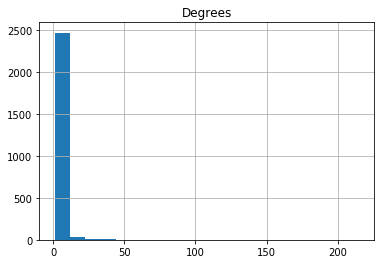

In [49]:
degrees = []
for node in quoteGraph.nodes():
  degrees.append(nx.degree(quoteGraph,node))
print('max degrees: {}'.format(max(degrees)))
degrees_df = pd.DataFrame(degrees, columns = ['Degrees'])
hist = degrees_df.hist(bins = 20)


##Part (c)

**Top 5 edges with highest weight:**

In [51]:
labels = nx.get_edge_attributes(quoteGraph,"numberMentions")
sorted(labels.items(), key = lambda x : x[1], reverse=True)[:5]

[(('johngodzich', 'motivational'), 42),
 (('johngodzich', 'tweetburst'), 23),
 (('mike_wesely', 'quotesource'), 22),
 (('lorimoreno', 'quotesource'), 19),
 (('ccopley', 'reapalife'), 16)]

##Part (d)

In [0]:
def configure_plotly_browser_state():
  
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [0]:

def addRandomPositions(graph):
    posDict = dict((node,(random.gauss(0,10),random.gauss(0,10))) for node in graph.nodes())
    nx.set_node_attributes(graph, name="pos", values=posDict)

In [0]:
addRandomPositions(quoteGraph)

In [0]:
def plotNetwork(graph):
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=1 ,color='#888'))
        scatters.append(s)



    for node in graph.nodes():
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                hoverinfo='none',
                mode='markers', 
                marker=dict(
                    color="#888", 
                    size=10,         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [0]:
def plotNetworkEdgeColor(graph):
    closenessCentr = nx.closeness_centrality(graph)
    maxCentr = max(closenessCentr.values())
    minCentr = min(closenessCentr.values())
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        edgeColor = int(299*(edgeWidth-1)/41)
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color=purd300[edgeColor]))
        scatters.append(s)



    for node in graph.nodes():
        nodeCentr = closenessCentr[node]
        
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text="User: %s\nCloseness: %.3f" % (node, nodeCentr),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color="#889", 
                    #size=nx.degree(graph,node),         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [57]:
purd = cl.scales['9']['seq']['PuRd']
purd300 = cl.interp(purd, 300)
HTML(cl.to_html(purd300))

In [59]:
configure_plotly_browser_state()
plotNetworkEdgeColor(quoteGraph)

#Question 3

##Part (a)

In [60]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [0]:
stopwords = stopwords.words('english')

In [95]:


allTweets = quoteTag["tweet"].str.cat(sep=' ')
tweetWords = [word.strip(""" ,.:@'\-~";#""").lower() for word in allTweets.split()]
words = [word for word in tweetWords if word not in stopwords]
wordCounter = Counter(words)
print('15 most common words:')
wordCounter.most_common(15)

15 most common words:


[('rt', 3547),
 ('quote', 2771),
 ('', 1548),
 ('quotes', 773),
 ('lorimoreno', 466),
 ('life', 314),
 ('mike_wesely', 299),
 ('love', 265),
 ('2009-06-12', 255),
 ('things', 250),
 ('screamingeagle1', 228),
 ('one', 211),
 ('make', 207),
 ('never', 204),
 ('like', 184)]

Since my hashtag was quotes, the most common themes were "meta" in nature, meaning they were about quotes in general as opposed to a particular quote. For example, quotes are often shared to be retweeted which explanes the top word of "rt". Other top words are the twitter names of highly active twitter members who share many quotes and use the #quotes hashtag such as lorimoreno and screamingeagle1.

##Part (b)

In [0]:
def plotNetworkTop3(graph):
    closenessCentr = nx.closeness_centrality(graph)
    maxCentr = max(closenessCentr.values())
    minCentr = min(closenessCentr.values())
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        edgeColor = int(299*(edgeWidth-1)/(54))
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color=purd300[edgeColor]))
        scatters.append(s)



    for node in graph.nodes():
        nodeCentr = closenessCentr[node]
        tweets = quoteTag[quoteTag.user == node]["tweet"].str.cat(sep=' ')
        tweetWords = [word.strip(""" ,.:'\";#""").lower() for word in allTweets.split()]
        words = [word for word in tweetWords if word not in stopwords]
        wordCounter = Counter(words)
        top_three = wordCounter.most_common(3)


        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text = "User: %s\nTop 3 Words: %s" % (node, top_three),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color="#889", 
                    #size=nx.degree(graph,node),         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [73]:
configure_plotly_browser_state()
plotNetworkTop3(quoteGraph)

#Question 4

##Part (a)

Two centrality measures:
>1. closeness centrality
>
>2. degree centrality

##Part (b)

In [0]:
def plotNetworkClosenessSizeColor(graph):
    closenessCentr = nx.closeness_centrality(graph)
    maxCentr = max(closenessCentr.values())
    minCentr = min(closenessCentr.values())
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color='#888'))
        scatters.append(s)



    for node in graph.nodes():
        nodeCentr = closenessCentr[node]
        nodeColor = int(299*(nodeCentr-minCentr)/(maxCentr-minCentr))
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text="User: %s\nCentrality: %.3f" % (node, nodeCentr),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color=purd300[nodeColor], 
                    size=nx.degree(graph,node),         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

In [0]:
def plotNetworkDegreeSizeColor(graph):
    degCentr = nx.degree_centrality(graph)
    maxCentr = max(degCentr.values())
    minCentr = min(degCentr.values())
    
    scatters=[]

    for (node1, node2) in graph.edges():
        x0, y0 = graph.nodes[node1]['pos']
        x1, y1 = graph.nodes[node2]['pos']
        edgeWidth = graph[node1][node2]['numberMentions']
        s = Scatter(
                x=[x0, x1],
                y=[y0, y1],
                hoverinfo='none',
                mode='lines', 
                line=scatter.Line(width=edgeWidth ,color='#888'))
        scatters.append(s)



    for node in graph.nodes():
        nodeCentr = degCentr[node]
        nodeColor = int(299*(nodeCentr-minCentr)/(maxCentr-minCentr))
        xPos, yPos = graph.nodes[node]['pos']
        s = Scatter(
                x=[xPos], 
                y=[yPos], 
                text="User: %s\nCentrality: %.3f" % (node, nodeCentr),
                hoverinfo='text',
                mode='markers', 
                marker=dict(
                    color=purd300[nodeColor], 
                    size=nx.degree(graph,node),         
                    line=dict(width=2)))
        scatters.append(s)
    
    layout = Layout(showlegend=False)
    fig = Figure(data=scatters, layout=layout)
    iplot(fig, show_link=False)

**Degree Centrality**

In [91]:
configure_plotly_browser_state()
plotNetworkDegreeSizeColor(quoteGraph)

**Closeness Centrality**

In [94]:
configure_plotly_browser_state()
plotNetworkClosenessSizeColor(quoteGraph)

##Part (c)

The key players in the degree centrality graph are primarily mike_wesely and then lorimoreno and screamingeagle1.

For closeness centrality, the key players are also the forementioned along with quotesource and several other smaller ones. 

While the top results are similar across both graphs,the magnitude of centrality across all top results varies between both graphs. For example, in the closeness centrality graph, all top results had a relatively similar amount of closeness, expaining why all their nodes have the same colour. However for the degree centrality graph, only mike_wesely has a dark coloured node, and significantly higher degree centrality. This makes the degree centrality graph much more informative as it shows the differences in closesness between all the top results. The reason for this may be that since my hashtag is #quotes, the tweets are generaly meant to be shared more frequently than other tweets. This means that users with many edges are more dominant in spreading quotes as opposed to how many users are closely reached by a quote-based tweet, which is generally more broadly shared as opposed to tagging other specific users. This makes degree centrality more informative as well for the previously mentioned reasons.

#Question 5

##Part (a)

In [93]:
print('Number of maximal cliques in graph:')
print(nx.graph_number_of_cliques(quoteGraph))

print("Size of the largest clique in graph:")
print(nx.graph_clique_number(quoteGraph))

Number of maximal cliques in graph:
2720
Size of the largest clique in graph:
4


##Part (b)

The largest clique size is 4 and there were  2720 of them in this social network. This tells me that the #quotes hashtag spreads to many small pockets of users where users share the tweeted quote with their close friends/users. That would explain why there are many cliques with a small size. This makes sense given the nature of the hashtag since quotes are generally meant to be spread and when a user likes a quote, they share it with their closer users.